In [1]:
import numpy as np 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")
#Default theme
sns.set_theme(palette='tab10',
              font='Lucida Calligraphy',
              font_scale=1.5,
              rc=None)

import matplotlib
matplotlib.rcParams.update({'font.size': 15})
plt.style.use('dark_background')

In [2]:
url = 'https://raw.githubusercontent.com/pranaykankariya97/Analyzing-TMDB-Dataset/master/train.csv'
df= pd.read_csv(url)
df.head()

,id,budget,homepage,imdb_id,original_language,original_title,overview,popularity,poster_path,release_date,...,departments_Art,departments_Crew,departments_Writing,departments_Costume & Make-Up,departments_Camera,departments_Directing,departments_Editing,departments_Visual Effects,departments_Lighting,departments_Actors
0,1,14000000,NaN,tt2637294,en,Hot Tub Time Machine 2,"When Lou, who has become the ""father of the In...",6.575393,/tQtWuwvMf0hCc2QR2tkolwl7c3c.jpg,2/20/15,...,12,4,2,13,8,4,2,4,4,0
1,2,40000000,NaN,tt0368933,en,The Princess Diaries 2: Royal Engagement,Mia Thermopolis is now a college graduate and ...,8.248895,/w9Z7A0GHEhIp7etpj0vyKOeU1Wx.jpg,8/6/04,...,0,0,1,0,1,1,1,0,0,0
2,3,3300000,http://sonyclassics.com/whiplash/,tt2582802,en,Whiplash,"Under the direction of a ruthless instructor, ...",64.299990,/lIv1QinFqz4dlp5U4lQ6HaiskOZ.jpg,10/10/14,...,5,9,1,5,4,3,6,3,1,0
3,4,1200000,http://kahaanithefilm.com/,tt1821480,hi,Kahaani,Vidya Bagchi (Vidya Balan) arrives in Kolkata ...,3.174936,/aTXRaPrWSinhcmCrcfJK17urp3F.jpg,3/9/12,...,0,0,1,0,0,1,0,0,0,0
4,5,0,NaN,tt1380152,ko,마린보이,Marine Boy is the story of a former national s...,1.148070,/m22s7zvkVFDU9ir56PiiqIEWFdT.jpg,2/5/09,...,0,0,1,0,0,1,0,0,0,0


# EDA

In [3]:
# drop the id columns 
print(df.shape)
columns = [col for col in df.columns if 'id' not in col]
df = df.loc[:, columns]
df.shape

(3000, 203)


(3000, 201)

In [5]:
# drop the columns that contain just the objects.
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
df = df[numeric_cols]
len(numeric_cols)

189

In [6]:
# drop the nul values
print('count the messing values( before) : ' , np.sum(list(df.isna().sum())))
df = df.dropna()
print('count the messing values( after) : ' , np.sum(list(df.isna().sum())))

count the messing values( before) :  2
count the messing values( after) :  0


In [31]:
df.iloc[:,:4].describe()

,budget,popularity,runtime,revenue
count,2.998000e+03,2998.000000,2998.000000,2.998000e+03
mean,2.254436e+07,8.468822,107.856571,6.677033e+07
std,3.703492e+07,12.106130,22.086434,1.375674e+08
min,0.000000e+00,0.000001,0.000000,1.000000e+00
25%,0.000000e+00,4.033052,94.000000,2.400517e+06
50%,8.000000e+06,7.388592,104.000000,1.681996e+07
75%,2.900000e+07,10.892477,118.000000,6.892583e+07
max,3.800000e+08,294.337037,338.000000,1.519558e+09


In [41]:
df.iloc[:,5].value_counts()
df.iloc[:,5].unique()

array([1, 4, 2, 3, 5, 6, 0, 7], dtype=int64)

In [7]:
# putting the quantitative columns in a list,and the same thing for the qualitative variables.
continuos_columns = []
categorical_columns = []
for column in df.columns :
    print('--------- | ', column , '  | -------------------')
    if len(list(df[column].unique())) < 10:
        categorical_columns.append(column)
        print(list(df[column].unique()))
        print(list(df[column].value_counts()))
    else :
        continuos_columns.append(columns)
        print( " it's countinuos variabele")

--------- |  budget   | -------------------
 it's countinuos variabele
--------- |  popularity   | -------------------
 it's countinuos variabele
--------- |  runtime   | -------------------
 it's countinuos variabele
--------- |  revenue   | -------------------
 it's countinuos variabele
--------- |  has_collection   | -------------------
[1, 0]
[2394, 604]
--------- |  num_genres   | -------------------
[1, 4, 2, 3, 5, 6, 0, 7]
[972, 900, 591, 393, 111, 21, 7, 3]
--------- |  genre_Drama   | -------------------
[0, 1]
[1530, 1468]
--------- |  genre_Comedy   | -------------------
[1, 0]
[1971, 1027]
--------- |  genre_Thriller   | -------------------
[0, 1]
[2209, 789]
--------- |  genre_Action   | -------------------
[0, 1]
[2257, 741]
--------- |  genre_Romance   | -------------------
[0, 1]
[2427, 571]
--------- |  genre_Crime   | -------------------
[0, 1]
[2529, 469]
--------- |  genre_Adventure   | -------------------
[0, 1]
[2559, 439]
--------- |  genre_Horror   | -----------

[2806, 192]
--------- |  cast_character_Herself   | -------------------
[1, 0]
[2917, 81]
--------- |  cast_character_Dancer   | -------------------
[0, 1]
[2909, 89]
--------- |  cast_character_Additional Voices (voice)   | -------------------
[0, 1]
[2983, 15]
--------- |  cast_character_Doctor   | -------------------
[0, 1]
[2808, 190]
--------- |  cast_character_Reporter   | -------------------
[0, 1]
[2849, 149]
--------- |  cast_character_Waitress   | -------------------
[0, 1]
[2868, 130]
--------- |  cast_character_Nurse   | -------------------
[0, 1]
[2845, 153]
--------- |  cast_character_Bartender   | -------------------
[0, 1]
[2891, 107]
--------- |  cast_character_Jack   | -------------------
[0, 1]
[2320, 678]
--------- |  cast_character_Debutante   | -------------------
[0, 1]
[2994, 4]
--------- |  cast_character_Security Guard   | -------------------
[0, 1]
[2915, 83]
--------- |  cast_character_Paul   | -------------------
[0, 1]
[2357, 641]
--------- |  cast_charact

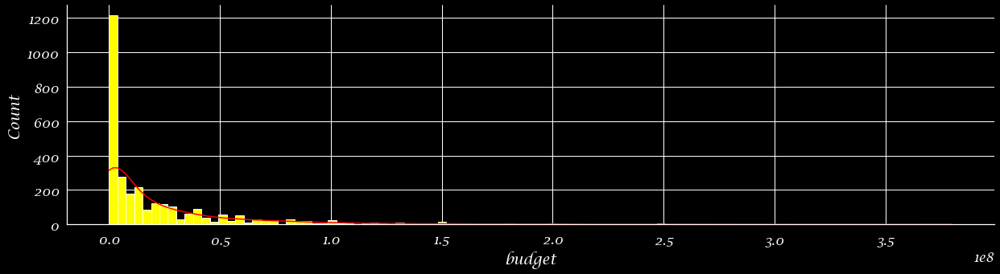

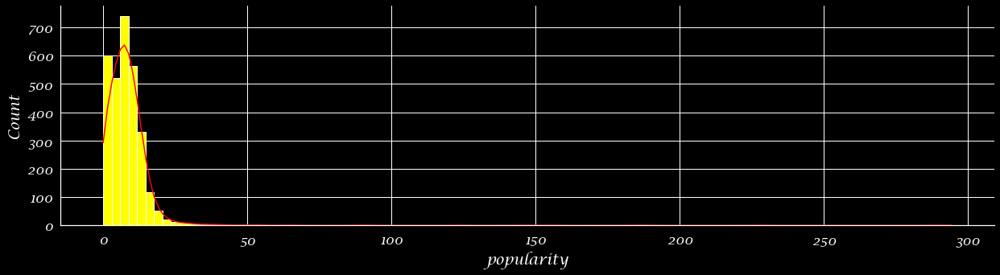

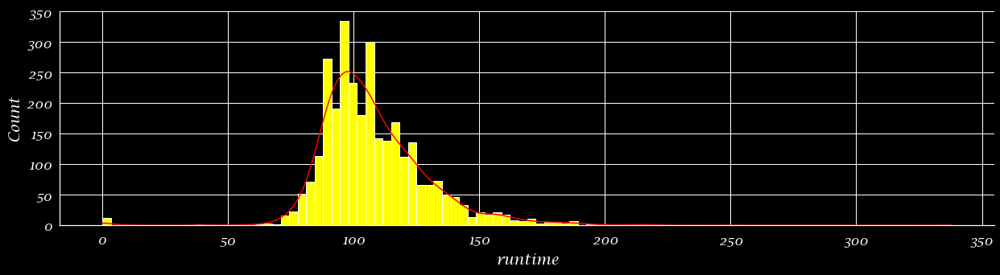

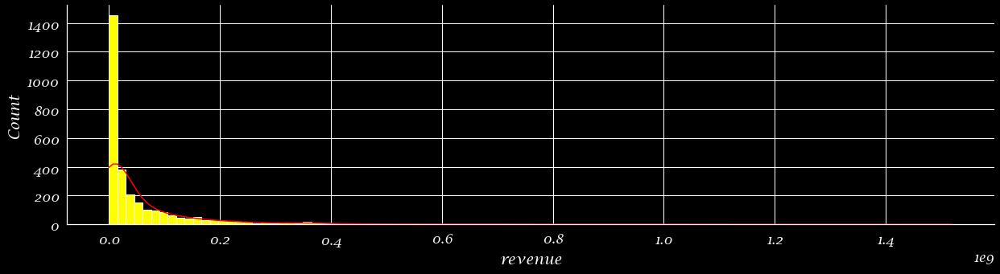

In [90]:
for column in df.iloc[:,:4].columns:
    sns.displot(data=df, x=column, kde=True, bins = 100,color = "red", facecolor = "yellow",height = 5, aspect = 3.5);

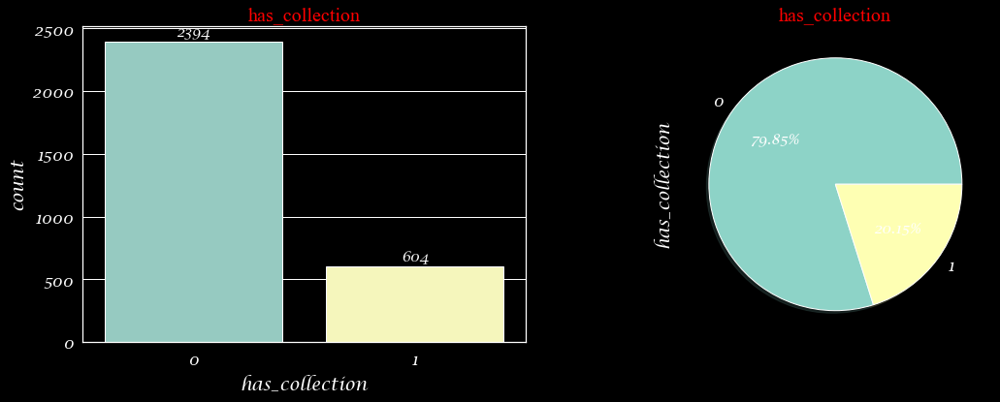

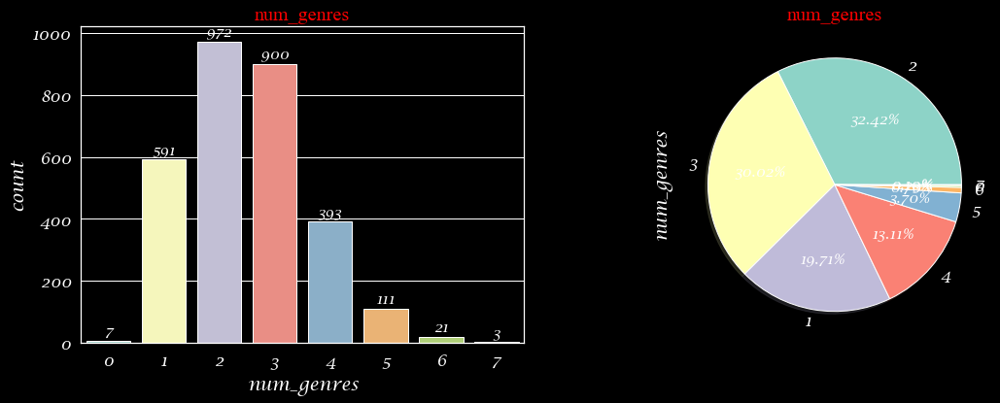

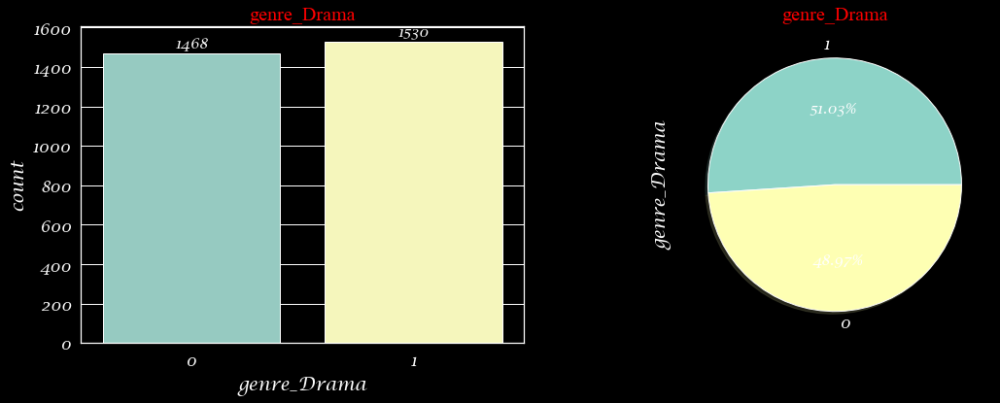

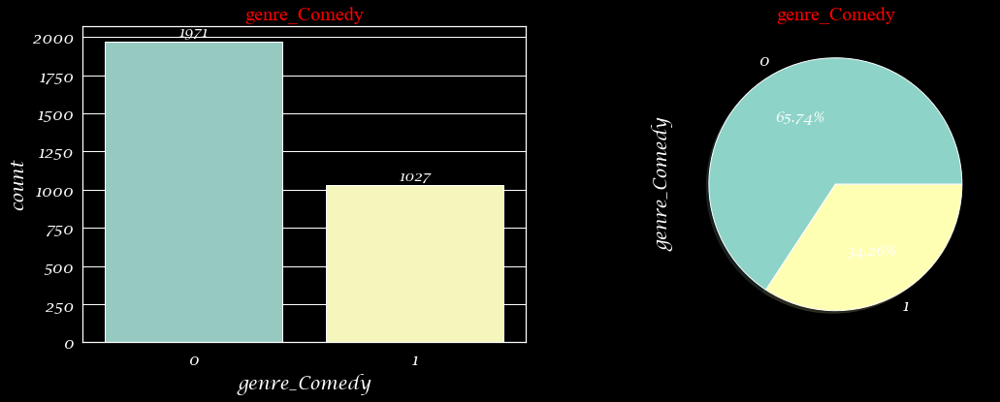

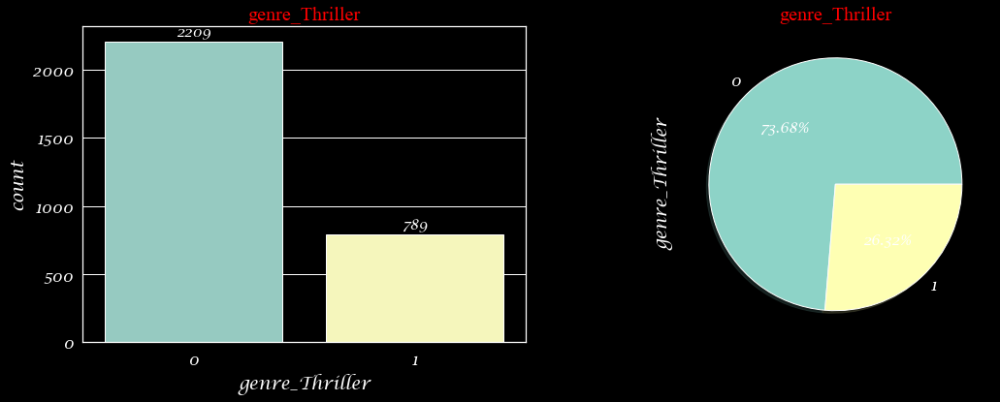

...

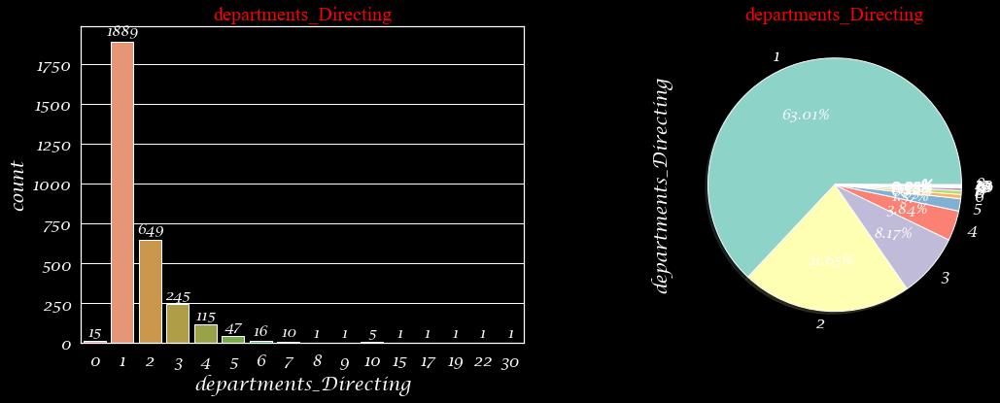

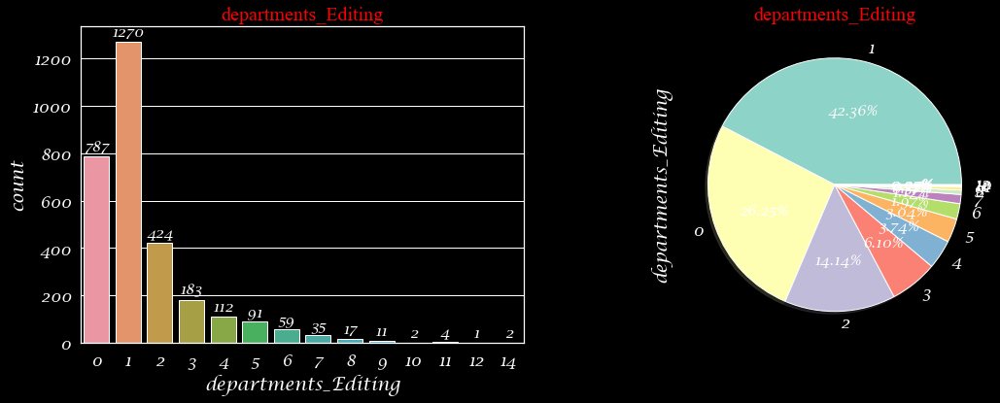

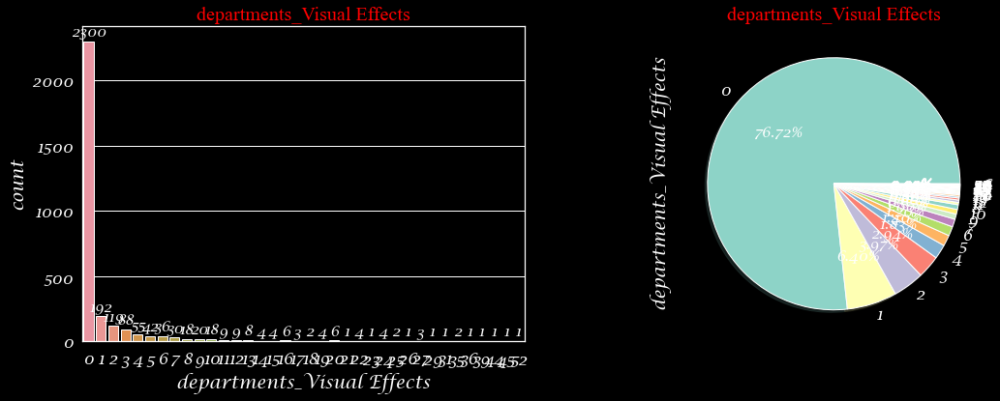

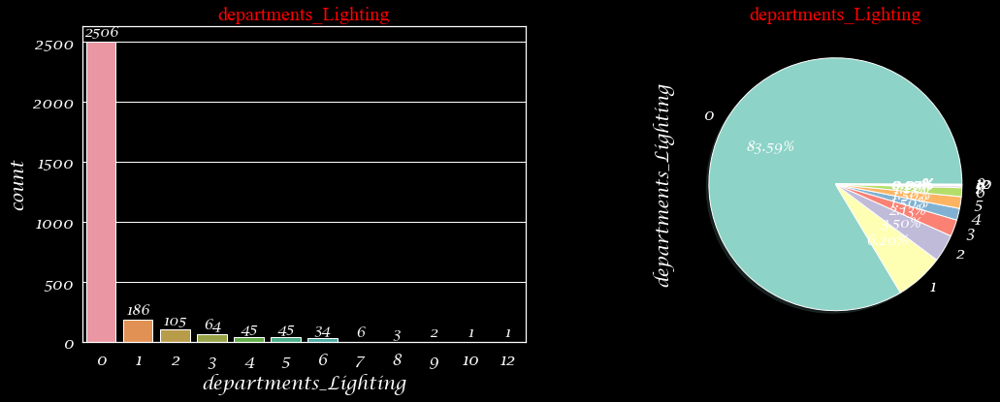

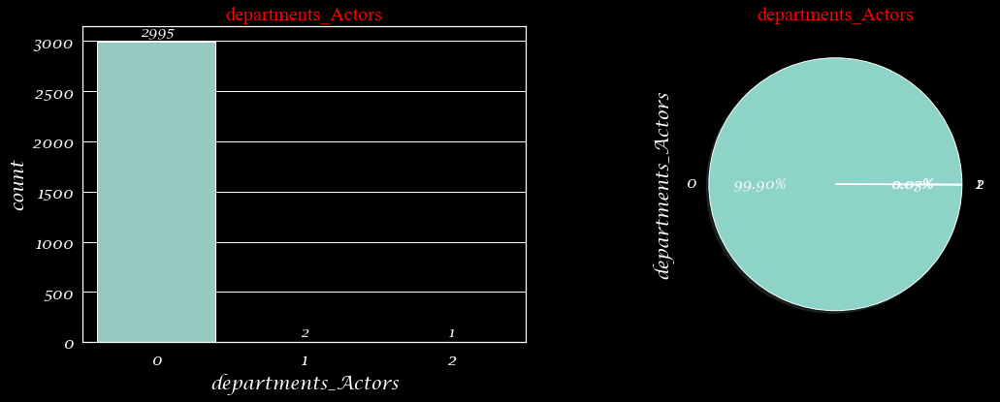

In [93]:
for column in categorical_columns:
    ax = plt.figure(figsize=(18,6))
    ax = plt.subplot(1,2,1)
    ax = sns.countplot(x=column, data=df)
    ax.bar_label(ax.containers[0])
    plt.title(column, fontsize=20,color='Red',font='Times New Roman')
    ax =plt.subplot(1,2,2)
    ax=df[column].value_counts().plot.pie(autopct='%1.2f%%',shadow=True);
    ax.set_title(label =column, fontsize = 20,color='Red',font='Times New Roman');

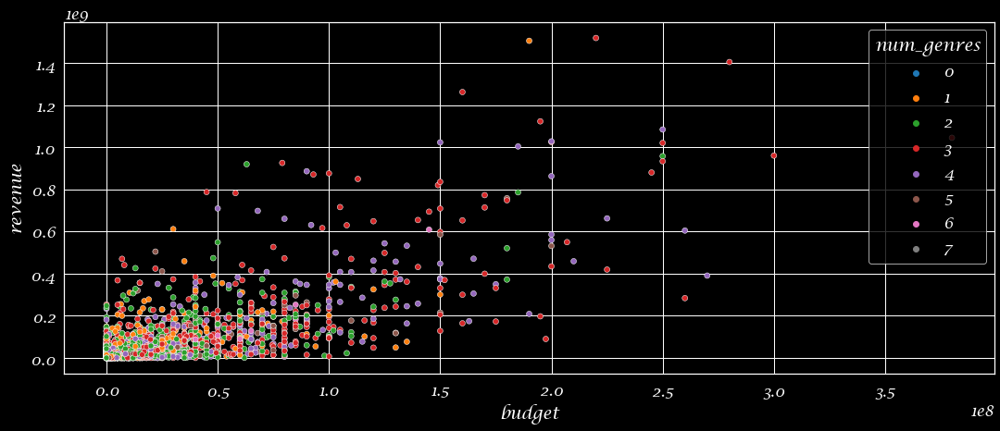

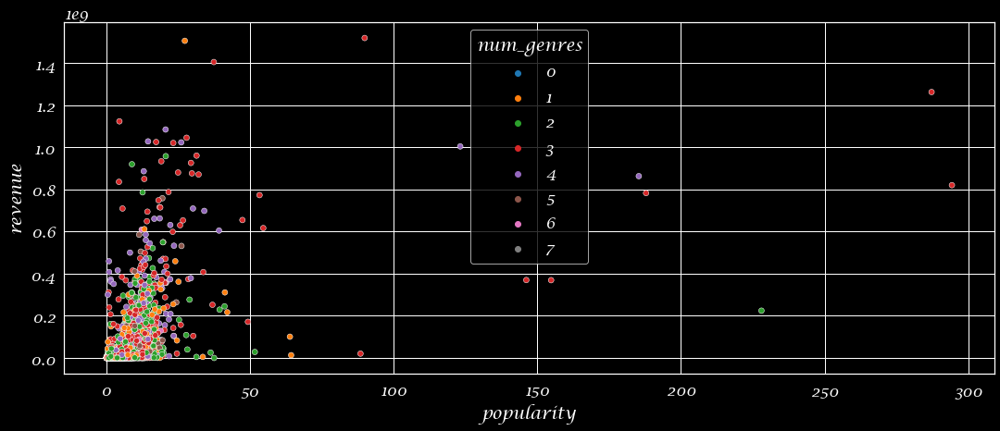

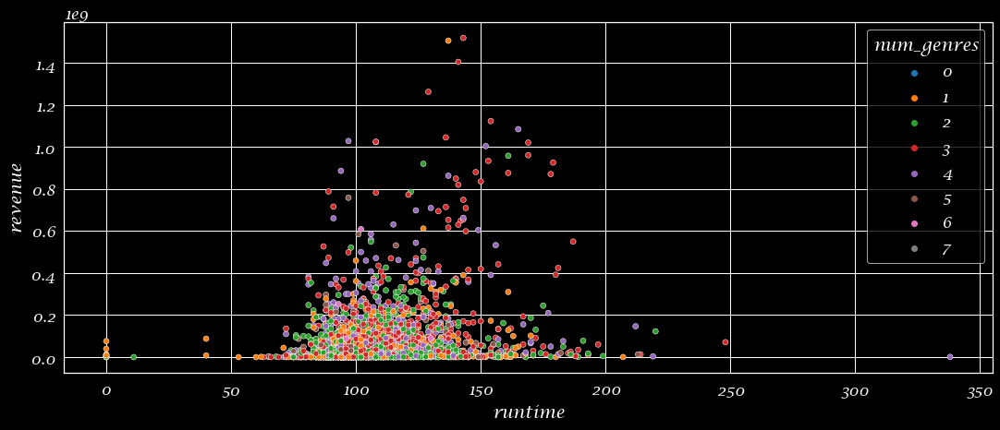

In [104]:
for column in df.iloc[:,:4].columns[:-1]:
    plt.figure(figsize=(18,7))
    sns.scatterplot(data=df, x=column, y="revenue", hue="num_genres",palette="tab10");

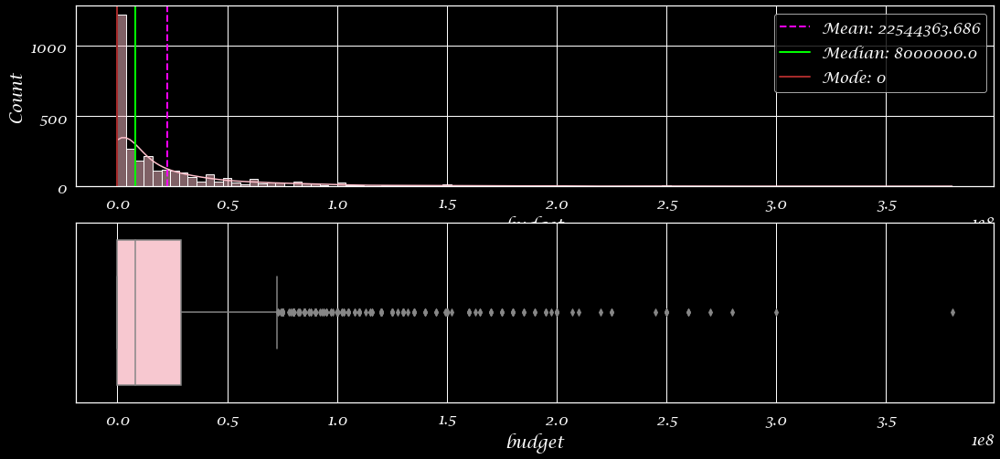

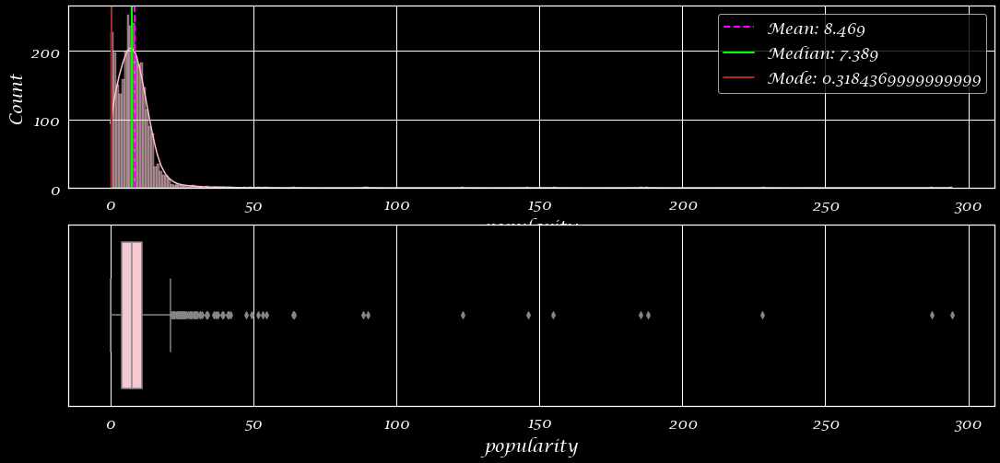

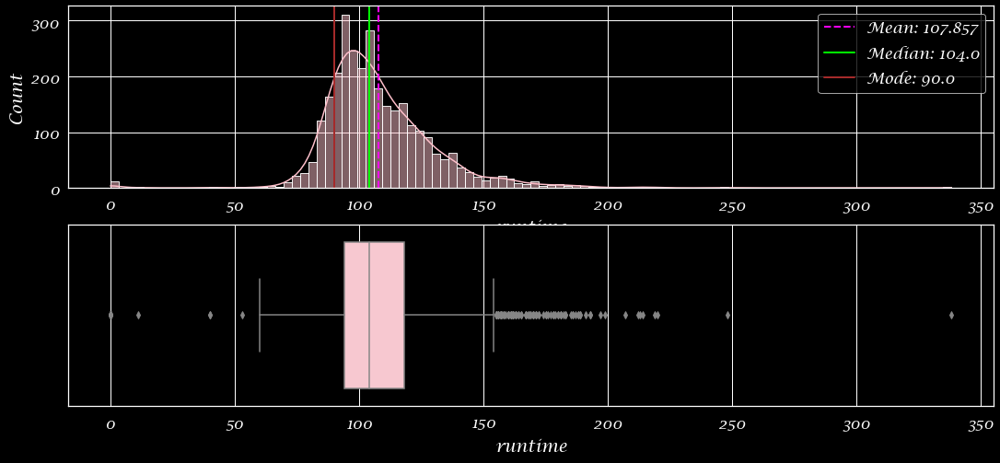

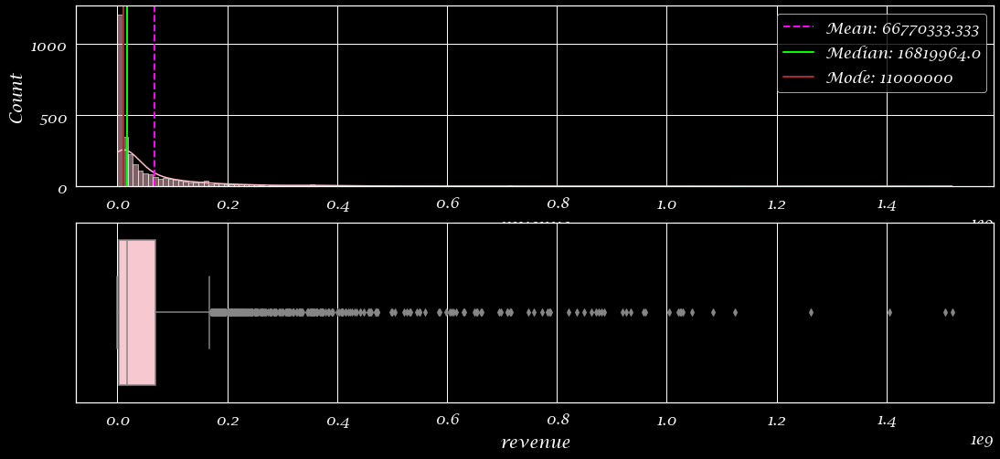

In [107]:
import statistics

def plot_hist(feature):
    fig, ax = plt.subplots(2, 1, figsize=(18, 8))   
    sns.histplot(data = df[feature], kde = True, ax = ax[0],color='pink')
    ax[0].axvline(x = df[feature].mean(), color = 'Magenta', linestyle = '--', linewidth = 2, label = 'Mean: {}'.format(round(df[feature].mean(), 3)))
    ax[0].axvline(x = df[feature].median(), color = 'lime', linewidth = 2, label = 'Median: {}'.format(round(df[feature].median(), 3)))
    ax[0].axvline(x = statistics.mode(df[feature]), color = 'brown', linewidth = 2, label = 'Mode: {}'.format(statistics.mode(df[feature])))
    ax[0].legend()    
    sns.boxplot(x = df[feature], ax = ax[1],color='pink')   
    plt.show()
    
for column in df.iloc[:,:4].columns:
    plot_hist(column)

In [116]:
df.head(2)

,budget,popularity,runtime,revenue,has_collection,num_genres,genre_Drama,genre_Comedy,genre_Thriller,genre_Action,...,departments_Art,departments_Crew,departments_Writing,departments_Costume & Make-Up,departments_Camera,departments_Directing,departments_Editing,departments_Visual Effects,departments_Lighting,departments_Actors
0,14000000,6.575393,93.0,12314651,1,1,0,1,0,0,...,12,4,2,13,8,4,2,4,4,0
1,40000000,8.248895,113.0,95149435,1,4,1,1,0,0,...,0,0,1,0,1,1,1,0,0,0


In [131]:
df2[df2['budget'] > 1*100000000 ]['budget']
df2.loc[14 , 'budget']= df2['budget'].mean()
df2.loc[14 , 'budget']

22517860.805098664

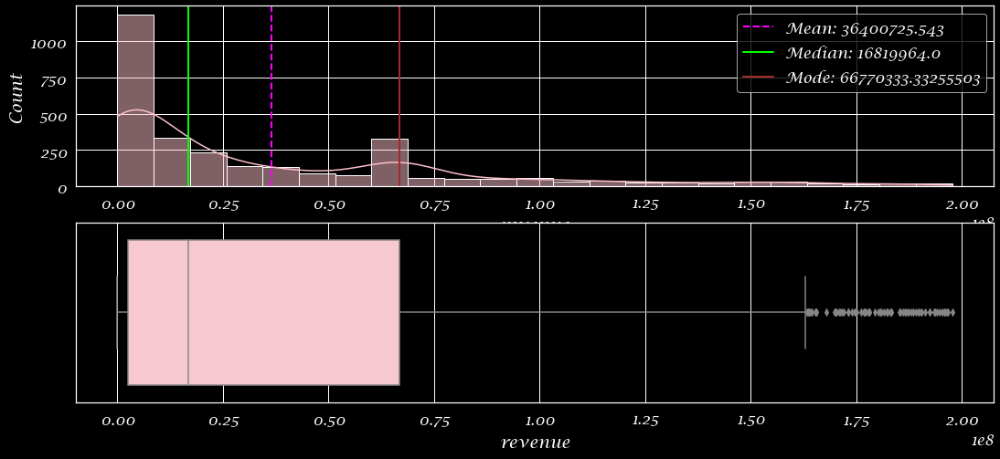

In [134]:
df2.loc[df2['revenue'] > 0.2*1000000000 , 'revenue'] = df2['revenue'].mean()
plot_hist('revenue')

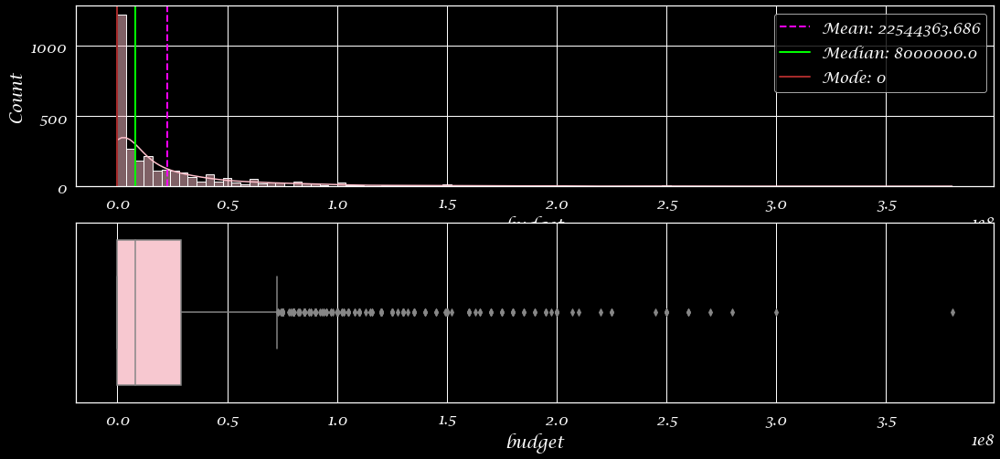

In [126]:

df2[df2['budget'] > 1*100000000 ]['budget'] =  df2['budget'].mean()
plot_hist('budget')

In [122]:
df2[df2['budget'] > 1*100000000 ]['budget'].shape

(125,)

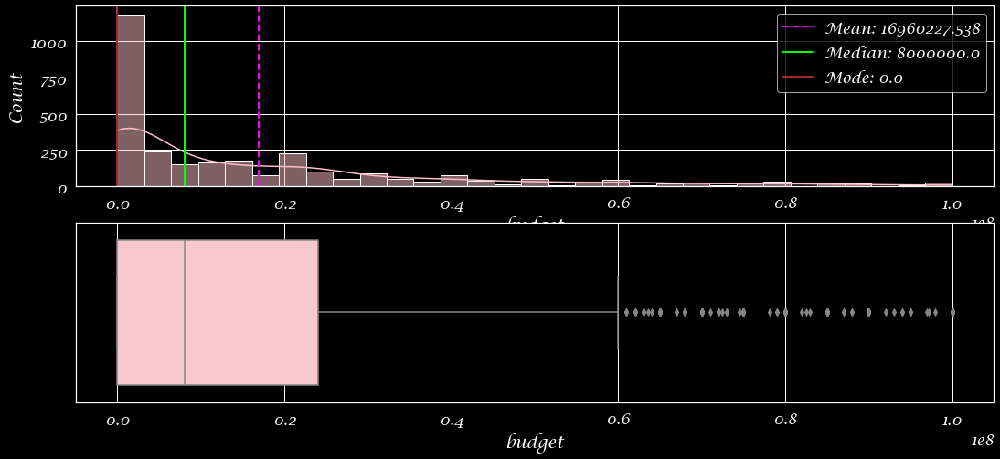

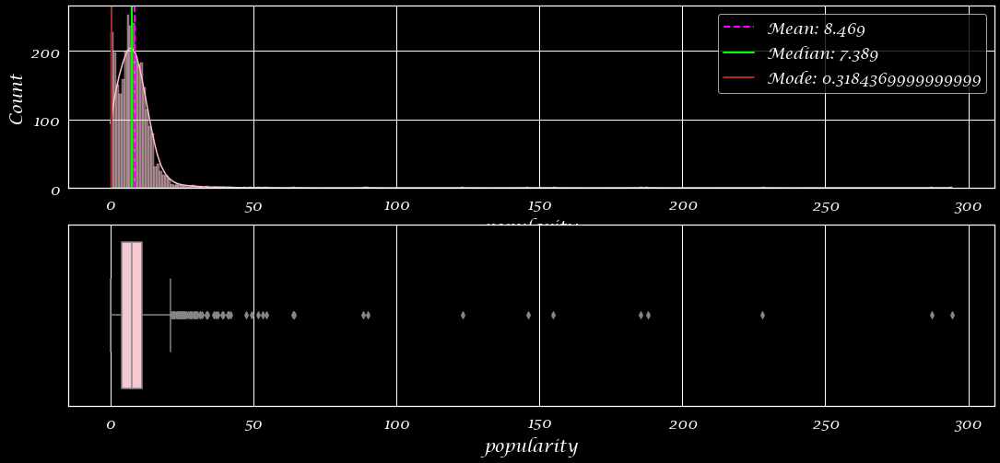

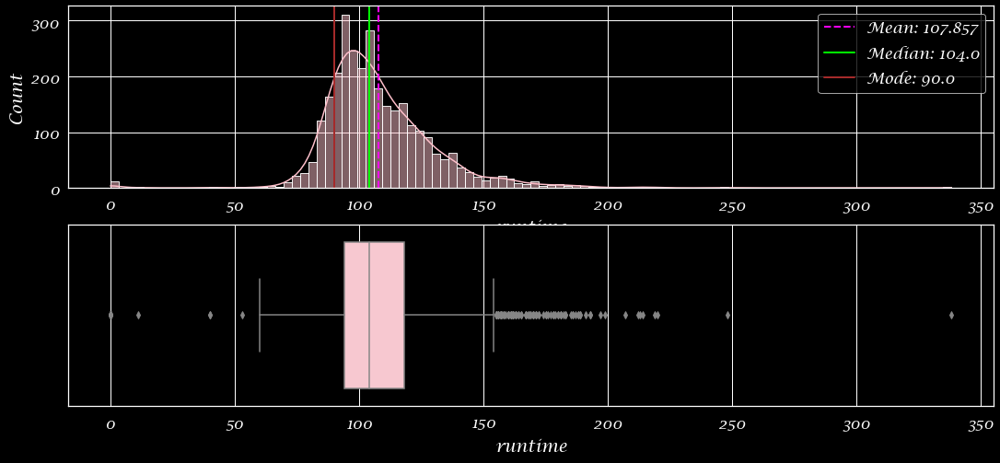

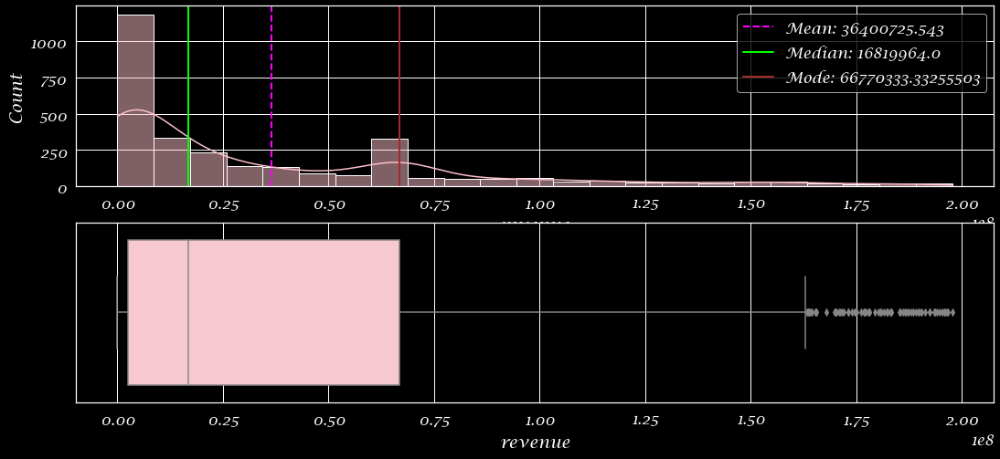

In [135]:
import statistics

def plot_hist(feature):
    fig, ax = plt.subplots(2, 1, figsize=(18, 8))   
    sns.histplot(data = df2[feature], kde = True, ax = ax[0],color='pink')
    ax[0].axvline(x = df2[feature].mean(), color = 'Magenta', linestyle = '--', linewidth = 2, label = 'Mean: {}'.format(round(df[feature].mean(), 3)))
    ax[0].axvline(x = df2[feature].median(), color = 'lime', linewidth = 2, label = 'Median: {}'.format(round(df[feature].median(), 3)))
    ax[0].axvline(x = statistics.mode(df2[feature]), color = 'brown', linewidth = 2, label = 'Mode: {}'.format(statistics.mode(df[feature])))
    ax[0].legend()    
    sns.boxplot(x = df2[feature], ax = ax[1],color='pink')   
    plt.show()
    
for column in df.iloc[:,:4].columns:
    plot_hist(column)

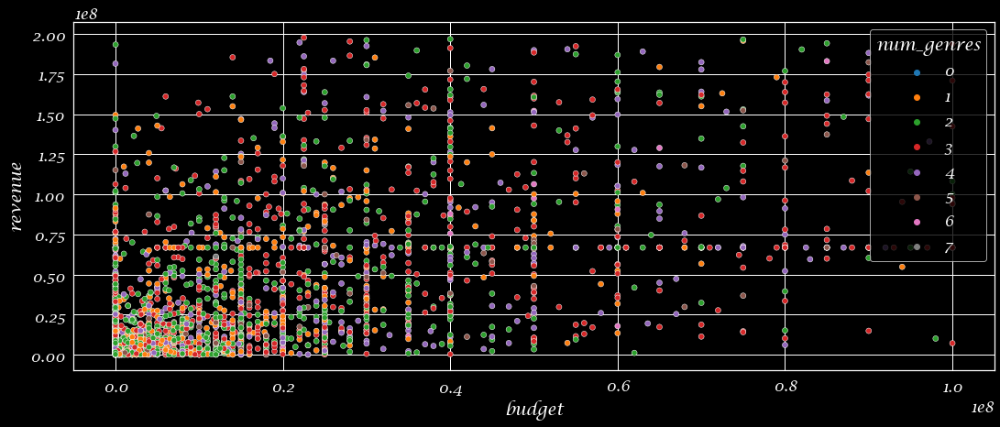

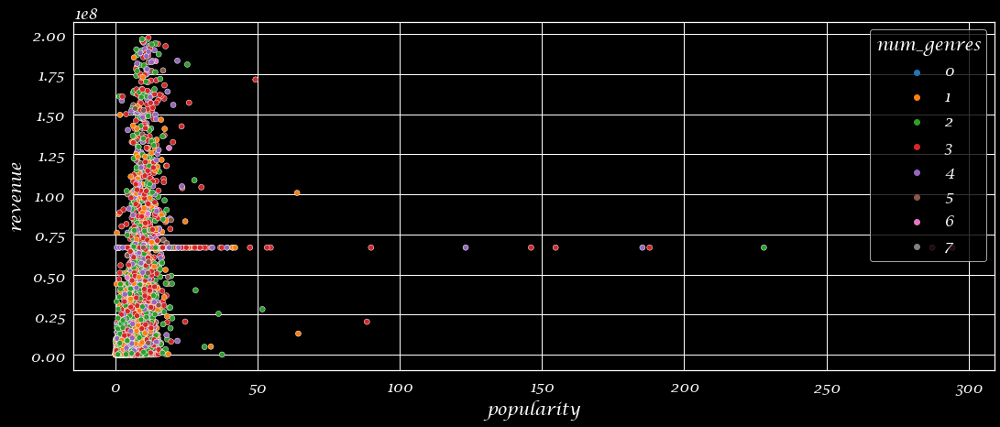

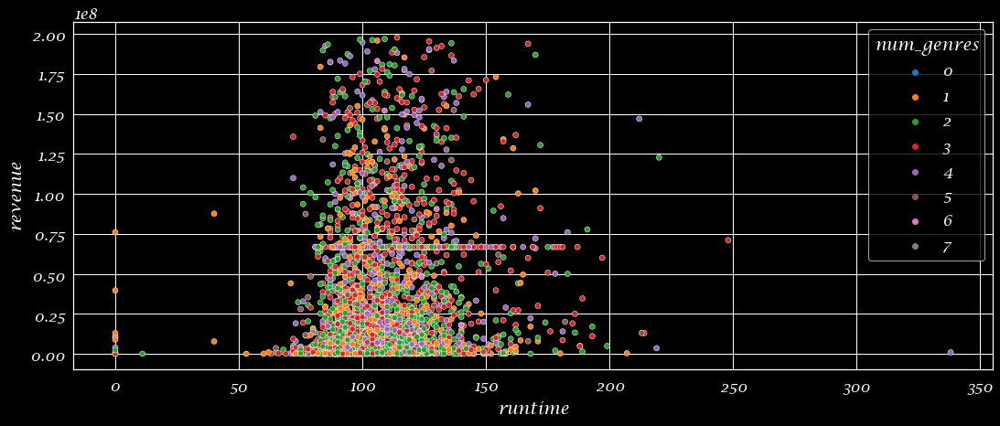

In [136]:
for column in df.iloc[:,:4].columns[:-1]:
    plt.figure(figsize=(18,7))
    sns.scatterplot(data=df2, x=column, y="revenue", hue="num_genres",palette="tab10");

### we have too many columns, so we need to eliminate some of them. or summarize them. 

### Factor Analysis of Mixed Data (FAMD) -----------------------------------------------------------------------------------------------

In [8]:
from sklearn.decomposition import FactorAnalysis
from sklearn.preprocessing import StandardScaler
def FAMD(df , number_col):
    X = df.drop(['revenue'], axis=1)
    y = df['revenue']
    transformer = FactorAnalysis(n_components=number_col, random_state=0)
    data = transformer.fit_transform(X)
    data = pd.DataFrame(data , columns = ['col{}'.format(i) for i in range(1,number_col+1)])
    scaler = StandardScaler()
    data['target'] = scaler.fit_transform(df[['revenue']])
    return data
data =FAMD(df,10)
data

,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,target
0,-0.230750,1.909009,-1.034373,-0.550229,-0.442036,-0.046438,0.076586,-1.513767,-0.908295,-2.451523,-0.395913
1,0.471408,-0.821373,0.193995,0.168558,-0.156615,0.854825,1.090451,-1.021144,-0.039394,0.313840,0.206327
2,-0.519714,2.332222,1.205506,-0.801435,4.633981,-0.545656,-0.067437,0.497824,-2.118556,0.532499,-0.390262
3,-0.576427,-0.583184,-0.157247,0.998646,0.103369,-0.799456,-0.308327,-0.736175,0.046426,0.461682,-0.369119
4,-0.608834,-0.666316,-0.380734,0.908015,-0.106827,-0.286404,-0.719198,-0.704368,0.125061,0.420772,-0.456917
...,...,...,...,...,...,...,...,...,...,...,...
2993,-0.608834,-0.126592,-0.134399,-0.040054,0.199799,1.064174,0.123478,1.315398,0.271144,-0.225923,-0.473837
2994,-0.608834,-0.131225,-0.325639,-0.011072,0.105869,-1.257025,0.057355,0.237121,-0.936626,0.625338,-0.484132
2995,1.146559,-1.163767,-0.035828,0.479480,0.420898,0.202401,0.104673,-0.121145,-0.003016,0.652543,0.164939
2996,0.525420,2.012343,-1.325717,-0.773026,-0.117753,1.208439,0.585522,-0.306599,-0.418258,-1.329158,0.764793


In [9]:
from sklearn.model_selection import train_test_split
def split(data , testSize) :
    X = data.drop(['target'], axis=1)
    y = data['target']
    # Split the data into training and testing sets
    return train_test_split(X, y, test_size=testSize, random_state=42)
X_train, X_test, y_train, y_test =split(data , 0.2)


In [18]:
from sklearn.datasets import load_boston
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet, SGDRegressor, BayesianRidge, HuberRegressor, PassiveAggressiveRegressor, RANSACRegressor, TheilSenRegressor
from sklearn.metrics import mean_squared_error, r2_score
def try_all_models():
    # Create a list of the models you want to fit
    models = [
        LinearRegression(),
        Ridge(),
        Lasso(),
        ElasticNet(),
        SGDRegressor(),
        BayesianRidge(),
        HuberRegressor(),
        PassiveAggressiveRegressor(),
        RANSACRegressor()
    ]

    # Define the hyperparameters to tune for each model
    params = [
        {},  # LinearRegression
        {'alpha': [0.1, 1.0, 10.0]},  # Ridge
        {'alpha': [0.1, 1.0, 10.0]},  # Lasso
        {'alpha': [0.1, 1.0, 10.0], 'l1_ratio': [0.25, 0.5, 0.75]},  # ElasticNet
        {'alpha': [0.0001, 0.001, 0.01], 'l1_ratio': [0.15, 0.25, 0.5, 0.75, 0.9]},  # SGDRegressor
        {'alpha_1': [1e-6, 1e-5, 1e-4], 'alpha_2': [1e-6, 1e-5, 1e-4]},  # BayesianRidge
        {'epsilon': [1.35, 1.5, 1.75], 'alpha': [0.0001, 0.001, 0.01]},  # HuberRegressor
        {'C': [0.01, 0.1, 1.0], 'epsilon': [0.1, 0.2, 0.3]},  # PassiveAggressiveRegressor
        {'residual_threshold': [2.0, 2.5, 3.0], 'max_trials': [50, 100, 200]}  # RANSACRegressor
        ]

    # Perform hyperparameter tuning using grid search with cross-validation
    for model, param in zip(models, params):
        grid = GridSearchCV(model, param, cv=5)
        grid.fit(X_train, y_train)
        y_pred = grid.predict(X_test)

        mse = mean_squared_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)

        print(f'{type(model).__name__}:')
        print(f'Best parameters: {grid.best_params_}')
        print(f'MSE: {mse:.2f}, R2 score: {r2:.2f}\n')
    return 'Done'
try_all_models()

LinearRegression:
Best parameters: {}
MSE: 0.32, R2 score: 0.57

Ridge:
Best parameters: {'alpha': 10.0}
MSE: 0.32, R2 score: 0.57

Lasso:
Best parameters: {'alpha': 0.1}
MSE: 0.32, R2 score: 0.56

ElasticNet:
Best parameters: {'alpha': 0.1, 'l1_ratio': 0.25}
MSE: 0.31, R2 score: 0.58

SGDRegressor:
Best parameters: {'alpha': 0.001, 'l1_ratio': 0.75}
MSE: 0.32, R2 score: 0.56

BayesianRidge:
Best parameters: {'alpha_1': 1e-06, 'alpha_2': 0.0001}
MSE: 0.32, R2 score: 0.57

HuberRegressor:
Best parameters: {'alpha': 0.0001, 'epsilon': 1.75}
MSE: 0.32, R2 score: 0.56

PassiveAggressiveRegressor:
Best parameters: {'C': 0.01, 'epsilon': 0.2}
MSE: 0.31, R2 score: 0.57

RANSACRegressor:
Best parameters: {'max_trials': 50, 'residual_threshold': 2.5}
MSE: 0.32, R2 score: 0.56



'Done'

In [19]:
from sklearn.datasets import load_boston
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

X = data.drop(['target'], axis=1)
y = data['target']
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the hyperparameters to tune
params = {
    'n_estimators': [50, 100, 200],
    'max_depth': [5, 10, 20],
    'min_samples_split': [2, 5, 10]
}

# Create a Random Forest Regressor model
rf = RandomForestRegressor(random_state=42)

# Perform hyperparameter tuning using grid search with cross-validation
grid = GridSearchCV(rf, params, cv=5)
grid.fit(X_train, y_train)
y_pred = grid.predict(X_test)

# Evaluate the model using mean squared error and R-squared
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Display the results
print(f'Best parameters: {grid.best_params_}')
print(f'MSE: {mse:.2f}, R2: {r2:.2f}')


Best parameters: {'max_depth': 20, 'min_samples_split': 2, 'n_estimators': 100}
MSE: 0.29, R2: 0.60


### the r2-score is too lowe that is not enough.

In [ ]:
import numpy as np
import pandas as pd
from sklearn.datasets import load_breast_cancer
from sklearn.preprocessing import KBinsDiscretizer
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


# SelectKBest --------------------------------------------------------------------------------------------

In [25]:
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.linear_model import LinearRegression


X = df.drop(['revenue'], axis=1)
y = df['revenue']

# define the feature selection
selector = SelectKBest(score_func=f_regression, k=10)

# fit the feature selection to the data
selector.fit(X, y)

# transform the data to only keep the selected features
X_selected = selector.transform(X)

# get the selected feature names
selected_features = X.columns[selector.get_support()]

# print the selected feature names and their importance scores
scores = selector.scores_
col_score =[]
for feature, score in zip(X.columns, scores):
    col_score.append([feature, score])
col_score

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:289: RuntimeWarning: divide by zero encountered in true_divide
  correlation_coefficient /= X_norms
C:\Users\Dell\anaconda3\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:358: RuntimeWarning: invalid value encountered in true_divide
  f_statistic = corr_coef_squared / (1 - corr_coef_squared) * deg_of_freedom


[['budget', 3921.4949204921677],
 ['popularity', 810.0922561269471],
 ['runtime', 147.16407588984433],
 ['has_collection', 389.833036640147],
 ['num_genres', 82.1138542667797],
 ['genre_Drama', 77.05822218159867],
 ['genre_Comedy', 2.8124507756260084],
 ['genre_Thriller', 0.1387750184405084],
 ['genre_Action', 105.49995187852902],
 ['genre_Romance', 7.3890948931491645],
 ['genre_Crime', 1.5568807157523652],
 ['genre_Adventure', 362.04214171705263],
 ['genre_Horror', 3.498618258008455],
 ['genre_Science Fiction', 53.35452156449744],
 ['genre_Family', 80.33191146229537],
 ['genre_Fantasy', 90.20685397374181],
 ['genre_Mystery', 0.6545422804866],
 ['genre_Animation', 52.1238538980772],
 ['genre_History', 5.8766248489358786],
 ['genre_Music', 3.1245330346202325],
 ['num_companies', 74.16438065370508],
 ['production_company_Warner Bros.', 41.3723449587277],
 ['production_company_Universal Pictures', 19.502568712190868],
 ['production_company_Paramount Pictures', 30.55451303655902],
 ['produ

In [26]:
relevant_columns = pd.DataFrame(col_score,columns=['columns' , 'score'] ).sort_values('score', ascending=False)['columns']
relevant_columns = list(relevant_columns)[:16]
data2 =df[relevant_columns]
data2['revenue']=df['revenue']

C:\Users\Dell\AppData\Local\Temp\ipykernel_6036\855130133.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data2['revenue']=df['revenue']


In [80]:
from sklearn.datasets import load_boston
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

X = data2.drop(['revenue'], axis=1)
y = data2['revenue']
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the hyperparameters to tune
params = {
    'n_estimators': [50, 100, 200],
    'max_depth': [5, 10, 20],
    'min_samples_split': [2, 5, 10]
}

# Create a Random Forest Regressor model
rf = RandomForestRegressor(random_state=42)

# Perform hyperparameter tuning using grid search with cross-validation
grid = GridSearchCV(rf, params, cv=5)
grid.fit(X_train, y_train)
y_pred = grid.predict(X_test)

# Evaluate the model using mean squared error and R-squared
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Display the results
print(f'Best parameters: {grid.best_params_}')
print(f'MSE: {mse:.2f}, R2: {r2:.2f}')

Best parameters: {'max_depth': 10, 'min_samples_split': 10, 'n_estimators': 200}
MSE: 4184011771538658.00, R2: 0.70


### there is an improvement so let's try something else.

# SequentialFeatureSelector ------------------------------------------------------------------------

In [96]:
from mlxtend.feature_selection import SequentialFeatureSelector
from sklearn.datasets import load_boston
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

# Load the Boston Housing dataset
X = df.drop(['revenue'], axis=1)
y = df['revenue']
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Create a linear regression model
lr = LinearRegression()

# Create a Sequential Feature Selector object
sfs = SequentialFeatureSelector(lr, forward=True, k_features=20, scoring='r2', cv=5)

# Fit the SFS object to the training data
sfs.fit(X_train, y_train)

# Print the selected feature indices and scores
print(f'Selected feature indices: {sfs.k_feature_idx_}')
print(f'Selected feature scores: {sfs.k_score_}')


Selected feature indices: (0, 1, 3, 7, 8, 9, 11, 13, 18, 36, 39, 78, 84, 108, 109, 143, 148, 151, 157, 161)
Selected feature scores: 0.6833601671146828


In [71]:
data3 = FAMD(data2,8)
X_train, X_test, y_train, y_test =split(data3 , 0.2)
try_all_models()

LinearRegression:
Best parameters: {}
MSE: 0.31, R2 score: 0.57

Ridge:
Best parameters: {'alpha': 10.0}
MSE: 0.31, R2 score: 0.57

Lasso:
Best parameters: {'alpha': 0.1}
MSE: 0.31, R2 score: 0.57

ElasticNet:
Best parameters: {'alpha': 0.1, 'l1_ratio': 0.25}
MSE: 0.30, R2 score: 0.58

SGDRegressor:
Best parameters: {'alpha': 0.001, 'l1_ratio': 0.9}
MSE: 0.31, R2 score: 0.58

BayesianRidge:
Best parameters: {'alpha_1': 1e-06, 'alpha_2': 0.0001}
MSE: 0.31, R2 score: 0.57

HuberRegressor:
Best parameters: {'alpha': 0.0001, 'epsilon': 1.75}
MSE: 0.32, R2 score: 0.56

PassiveAggressiveRegressor:
Best parameters: {'C': 0.01, 'epsilon': 0.3}
MSE: 0.33, R2 score: 0.54

RANSACRegressor:
Best parameters: {'max_trials': 200, 'residual_threshold': 3.0}
MSE: 0.31, R2 score: 0.58



'Done'

In [99]:
cols = []
X = df.drop(['revenue'], axis=1)
for i in [0, 1, 3, 7, 8, 9, 11, 13, 39, 78, 108, 109, 148, 151, 157, 161]:
    cols.append(list(X.columns)[i])
data2 =df[cols]
data2['revenue']=df['revenue']

C:\Users\Dell\AppData\Local\Temp\ipykernel_5340\474752075.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data2['revenue']=df['revenue']


In [98]:
from sklearn.datasets import load_boston
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

X = data2.drop(['revenue'], axis=1)
y = data2['revenue']
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the hyperparameters to tune
params = {
    'n_estimators': [50, 100, 200],
    'max_depth': [5, 10, 20],
    'min_samples_split': [2, 5, 10]
}

# Create a Random Forest Regressor model
rf = RandomForestRegressor(random_state=42)

# Perform hyperparameter tuning using grid search with cross-validation
grid = GridSearchCV(rf, params, cv=5)
grid.fit(X_train, y_train)
y_pred = grid.predict(X_test)

# Evaluate the model using mean squared error and R-squared
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Display the results
print(f'Best parameters: {grid.best_params_}')
print(f'MSE: {mse:.2f}, R2: {r2:.2f}')

Best parameters: {'max_depth': 10, 'min_samples_split': 2, 'n_estimators': 100}
MSE: 3968683876379556.00, R2: 0.71


## i think this is the further i can get, i have tried too many other ways to improve the score but that was helpful.